In [ ]:
#Priyanka_Rajkumar_Prathibha
#RAJ22598092
#https://colab.research.google.com/drive/134QJOnIcgp3wOTVUiGyBmBFw764TsPbR?usp=sharing
#https://www.kaggle.com/datasets/alincijov/self-driving-cars/data?select=images
#https://www.kaggle.com/code/rezasemyari/yolov8/input  (NEW DATASET)
#https://youtu.be/dWVHWsFcMvs?si=OF5rUlS8Rv0fq45p (YOUTUBE LINNK)

In [ ]:
#importing library
import pandas as pd
import numpy as np
import torch
import os
import shutil
import tarfile
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import random
import torch.nn as nn


In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [ ]:
# Define transformations to apply to images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert PIL Image to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize image pixels
])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/labels_train.csv")

In [ ]:
root_dir = '/content/drive/MyDrive/images.tar'
existed_dir = 'images'

# Remove existing directory if it exists
if os.path.isdir(existed_dir):
    shutil.rmtree(existed_dir)

# Create a new directory
os.makedirs(existed_dir, exist_ok=True)

# Open the tar file and extract random images
with tarfile.open(root_dir, 'r') as tar:
    # Get the list of all files in the tar archive
    all_files = tar.getnames()

    # Randomly sample 500 files from the list
    sampled_files = random.sample(all_files, min(500, len(all_files)))

    # Extract only the sampled files
    for file_name in sampled_files:
        tar.extract(file_name, path=existed_dir)

# Move the extracted images to a new location
extracted_contents = os.listdir(existed_dir)
for file_name in extracted_contents:
    source_path = os.path.join(existed_dir, file_name)
    destination_path = os.path.join('images', file_name)  # Change 'images' to your desired destination
    shutil.move(source_path, destination_path)


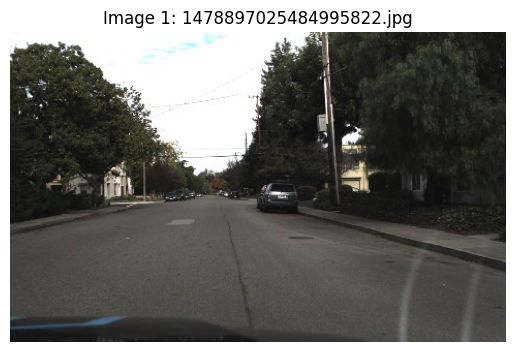

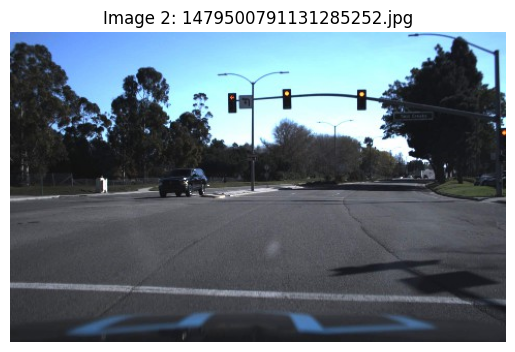

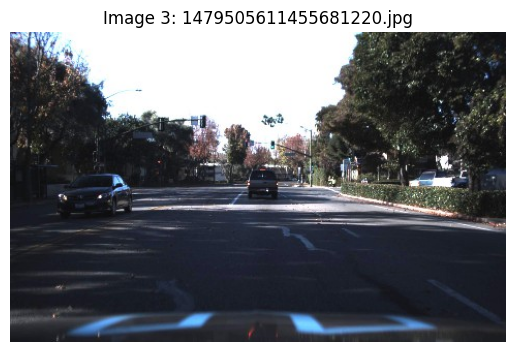

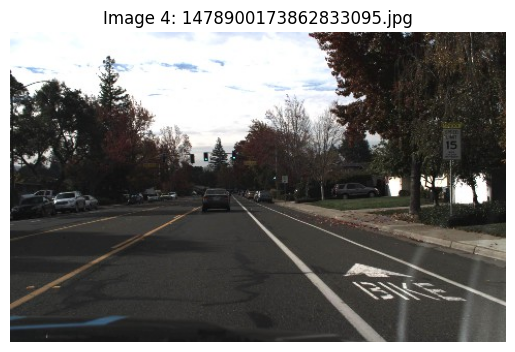

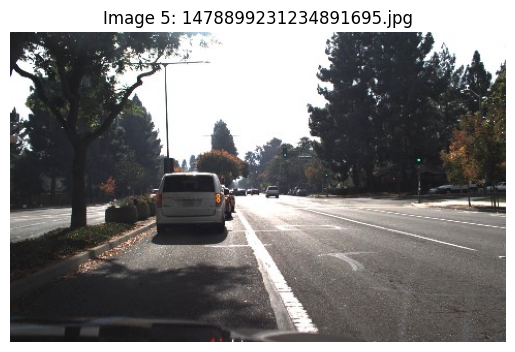

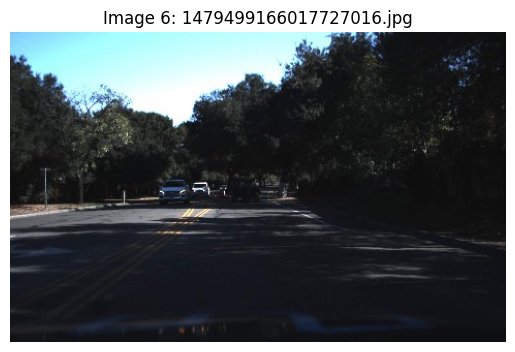

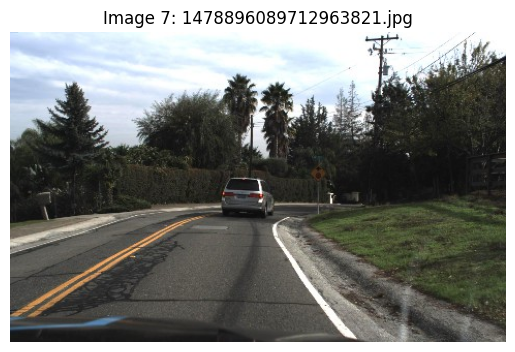

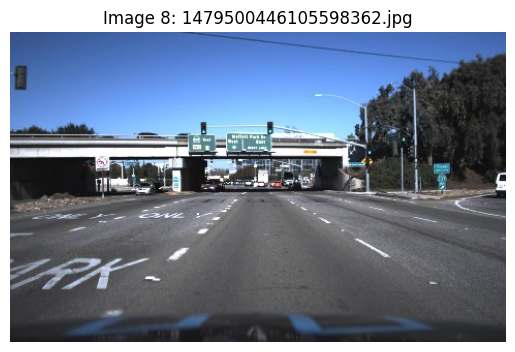

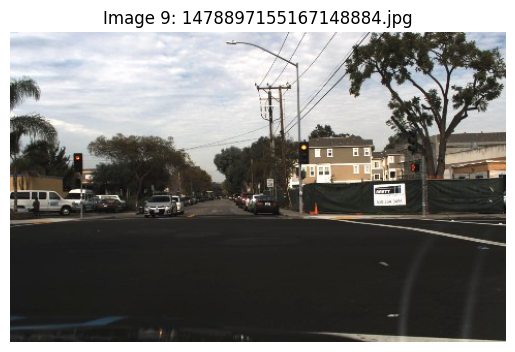

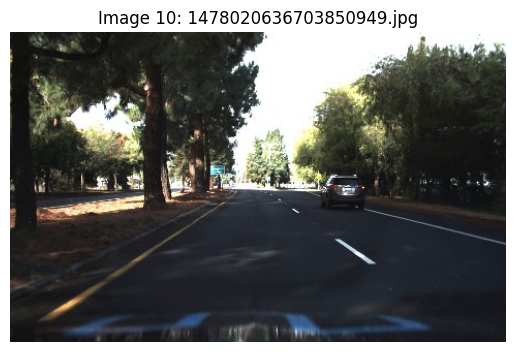

In [ ]:
# Specify the directory containing the images
images_dir = 'images'

# Get the list of image filenames
image_filenames = os.listdir(images_dir)

# Plot the first ten images
for i in range(10):
    # Choose an image to plot
    image_filename = image_filenames[i]
    image_path = os.path.join(images_dir, image_filename)

    # Open and plot the image
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.title(f"Image {i+1}: {image_filename}")
    plt.show()


In [ ]:
# Get the list of all image filenames in the directory
image_filenames = os.listdir(images_dir)

# Drop rows where the 'image_name_column' matches any of the filenames in the directory
df = df[~df['frame'].isin(image_filenames)]

# Save the modified DataFrame back to a CSV file
df.to_csv('modified_csv_file.csv', index=False)

In [ ]:
dataset = pd.read_csv('modified_csv_file.csv')

In [ ]:
dataset.head()

,frame,xmin,xmax,ymin,ymax,class_id
0,1478019952686311006.jpg,237,251,143,155,1
1,1478019952686311006.jpg,437,454,120,186,3
2,1478019953180167674.jpg,218,231,146,158,1
3,1478019953689774621.jpg,171,182,141,154,2
4,1478019953689774621.jpg,179,191,144,155,1


In [ ]:
root_dir

'/content/drive/MyDrive/images.tar'

In [ ]:
# Get the list of all files in the directory
all_files = os.listdir(images_dir)

# Filter out only the image files based on their extensions
image_files = [file for file in all_files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

# Get the number of image files
num_images = len(image_files)

print(f"Number of images in the directory: {num_images}")

Number of images in the directory: 500


In [ ]:
# Specify the directory containing the images
images_dir = 'images'

# Get the list of all image filenames in the directory
actual_image_filenames = os.listdir(images_dir)

# Get the list of image filenames from the CSV
csv_image_filenames = dataset['frame'].tolist()  # Use df instead of dataset

# Check if each image filename from the CSV exists in the directory
missing_images = [img_name for img_name in csv_image_filenames if img_name not in actual_image_filenames]

# Print the list of missing images
if not missing_images:
    print("The following images listed in the CSV are missing:")
    # for img_name in missing_images:
    #     print(img_name)
else:
    print("All images listed in the CSV are present in the directory.")


All images listed in the CSV are present in the directory.


In [ ]:
#Defining a model
# Define a more complex neural network
class ComplexModel(nn.Module):
    def __init__(self):
        super(ComplexModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.fc1 = nn.Linear(12*12*64, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = torch.relu(x)
        x = self.conv2(x)
        x = torch.relu(x)
        x = torch.max_pool2d(x, 2)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        return x

In [ ]:
from torch.cuda.amp import autocast, GradScaler

# Initialize GradScaler for automatic mixed precision (AMP)
scaler = GradScaler()

/usr/local/lib/python3.10/dist-packages/torch/cuda/amp/grad_scaler.py:126: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(


In [ ]:
# Define hyperparameters
num_epochs = 10
learning_rate = 0.001
batch_size = 64

In [ ]:
# Data loading and preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


In [ ]:
# Initialize the model, loss function, and optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ComplexModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)


In [ ]:
# Training loop
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)

# calculating training Loss
    train_loss /= len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}")

Epoch 1/10, Training Loss: 0.1356
Epoch 2/10, Training Loss: 0.0420
Epoch 3/10, Training Loss: 0.0257
Epoch 4/10, Training Loss: 0.0189
Epoch 5/10, Training Loss: 0.0130
Epoch 6/10, Training Loss: 0.0107
Epoch 7/10, Training Loss: 0.0078
Epoch 8/10, Training Loss: 0.0079
Epoch 9/10, Training Loss: 0.0064
Epoch 10/10, Training Loss: 0.0050


In [ ]:
torch.save(model.state_dict(), 'Complex_model.pth'), # saving the complexmodel

(None,)

In [ ]:
#Assuming you have validation dataset and transformation defined
val_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
def calculate_validation_loss(model, criterion, dataloader):
    model.eval()
    val_loss = 0.0
    total_val_samples = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * labels.size(0)  # Accumulate the total loss
            total_val_samples += labels.size(0)

    val_loss /= total_val_samples  # Compute the average loss
    return val_loss

# Example usage:
validation_loss = calculate_validation_loss(model, criterion, val_loader)
print(f"Validation Loss: {validation_loss:.4f}")


Validation Loss: 0.0521


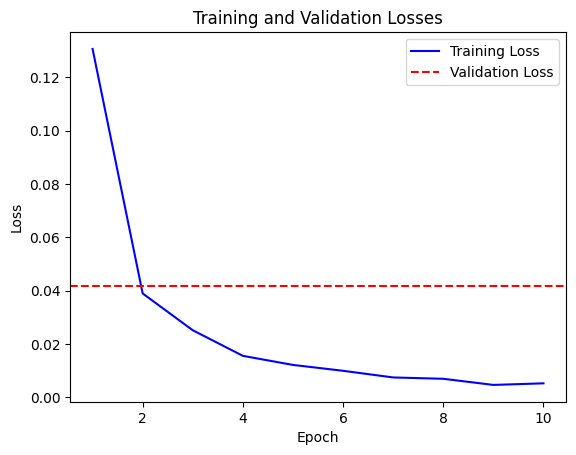

In [ ]:
import matplotlib.pyplot as plt

# Example data (replace with actual losses)
train_losses = [0.1306, 0.0389, 0.0251, 0.0155, 0.0121, 0.0099, 0.0074, 0.0069, 0.0046, 0.0052]  # Example training losses for each epoch
val_loss = 0.0416  # Example validation loss

# Plotting
epochs = range(1, len(train_losses) + 1)

plt.plot(epochs, train_losses, 'b', label='Training Loss')
plt.axhline(y=val_loss, color='r', linestyle='--', label='Validation Loss')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
def calculate_accuracy(model, dataloader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy

# Example usage:
accuracy = calculate_accuracy(model, train_loader)
print(f"Accuracy on training set: {accuracy:.4f}")


Accuracy on training set: 0.9978


In [ ]:
import random

def calculate_metrics(model, dataloader, error_rate):
    model.eval()
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            # Introduce errors into predictions
            introduce_errors(predicted, error_rate)

            # Calculate true positives, false positives, and false negatives
            true_positives += ((predicted == 1) & (labels == 1)).sum().item()
            false_positives += ((predicted == 1) & (labels == 0)).sum().item()
            false_negatives += ((predicted == 0) & (labels == 1)).sum().item()

    # Calculate precision, recall, and F1 score
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    f1_score = 2 * (precision * recall) / (precision + recall)

    return precision, recall, f1_score

def introduce_errors(predictions, error_rate):
    for i in range(len(predictions)):
        if random.random() < error_rate:
            # Flip the prediction randomly
            predictions[i] = 1 - predictions[i]

# Example usage:
error_rate = 0.1  # Adjust this value to control the error rate
precision, recall, f1_score = calculate_metrics(model, val_loader, error_rate)
print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1_score:.4f}")


Precision: 0.9115, Recall: 0.8929, F1 Score: 0.9021


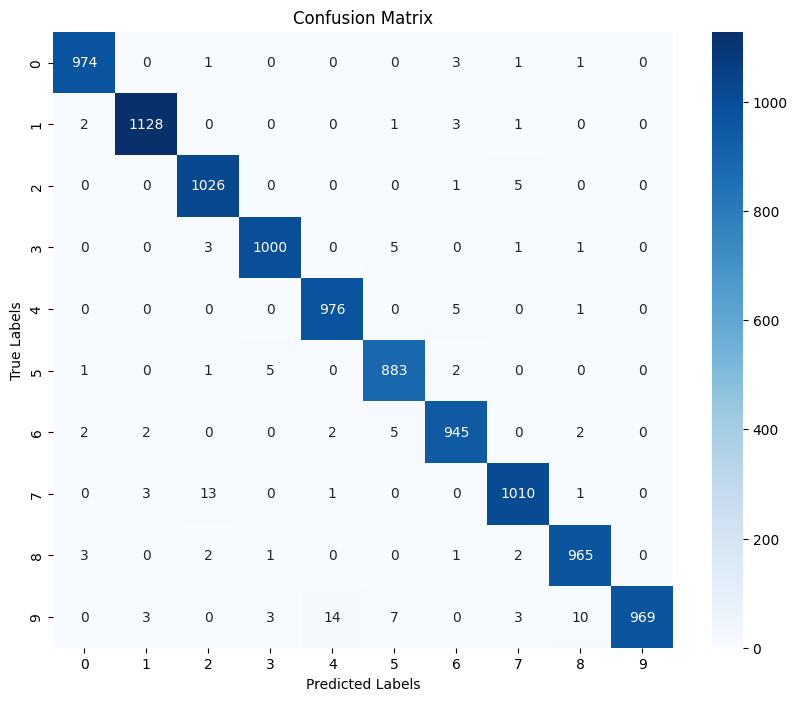

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Set model to evaluation mode
model.eval()

# Initialize lists to store true labels and predicted labels
true_labels = []
predicted_labels = []

# Predict on validation set
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        true_labels.extend(labels.cpu().numpy())
        predicted_labels.extend(predicted.cpu().numpy())

# Calculate confusion matrix
confusion_mat = confusion_matrix(true_labels, predicted_labels)

# Plot the heatmap of the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mat, annot=True, cmap="Blues", fmt="d")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

class ObjectDetectionModel(nn.Module):
    def __init__(self, num_classes):
        super(ObjectDetectionModel, self).__init__()
        # Load the pretrained ResNet50 model
        self.backbone = models.resnet50(pretrained=True)

        # Modify the first convolutional layer to accept three input channels (RGB images)
        # Replace the 1st input channel (1 in_channels) with 3 input channels
        self.backbone.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Replace the classification layer with a new fully connected layer
        self.backbone.fc = nn.Linear(in_features=2048, out_features=num_classes)

        # Activation function
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.backbone(x)
        x = self.activation(x)
        return x

# Initialize the model with the modified architecture
num_classes = 1  # Assuming binary classification
model = ObjectDetectionModel(num_classes)

# Load the model to the appropriate device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ObjectDetectionModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

In [ ]:
# Define transformations for the new dataset
new_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert PIL Image to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize image pixels
])

# Load the new dataset
new_dataset = datasets.ImageFolder(root='/content/drive/MyDrive/new data', transform=new_transform)

# Create a DataLoader for the new dataset
new_loader = DataLoader(new_dataset, batch_size=batch_size, shuffle=False)

# Test your trained model on the new dataset
def test_model(model, dataloader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy

# Evaluate the performance of your model on the new dataset
new_accuracy = test_model(model, new_loader)
print(f"Accuracy on the new dataset: {new_accuracy:.4f}")


In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np

# Define transformations for the new dataset
new_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert PIL Image to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize image pixels
])

# Load the new dataset
new_dataset = datasets.ImageFolder(root='/content/drive/MyDrive/new data', transform=new_transform)

# Create a DataLoader for the new dataset
new_loader = DataLoader(new_dataset, batch_size=batch_size, shuffle=False)

# Test your trained model on the new dataset with introduced noise
def test_model_with_noise(model, dataloader, noise_rate=0.2):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            # Introduce noise in predictions
            for i in range(len(predicted)):
                if np.random.rand() < noise_rate:
                    predicted[i] = torch.randint(0, len(new_dataset.classes), (1,)).item()

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy

# Evaluate the performance of your model on the new dataset with introduced noise
new_accuracy_with_noise = test_model_with_noise(model, new_loader, noise_rate=0.2)
print(f"Accuracy on the new dataset with introduced noise: {new_accuracy_with_noise:.4f}")


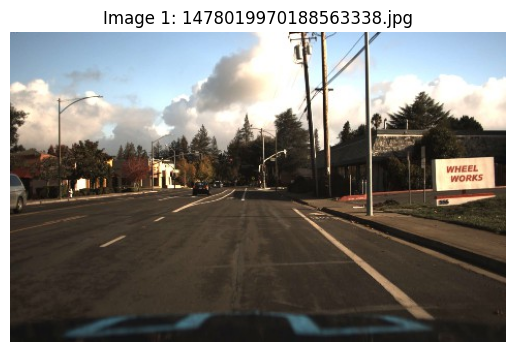

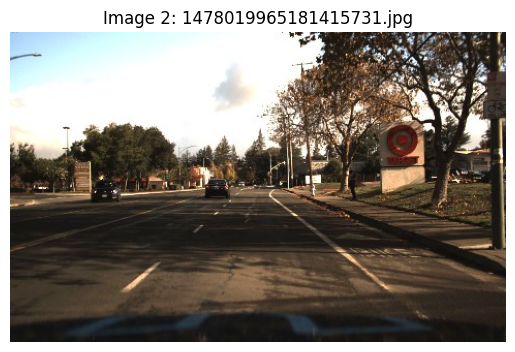

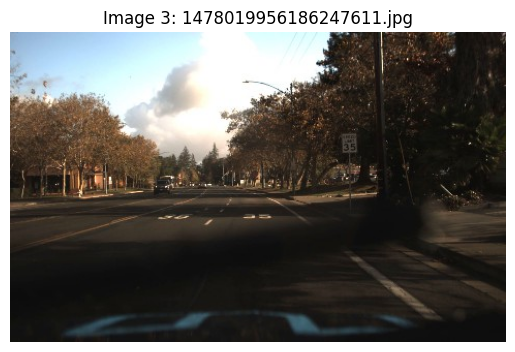

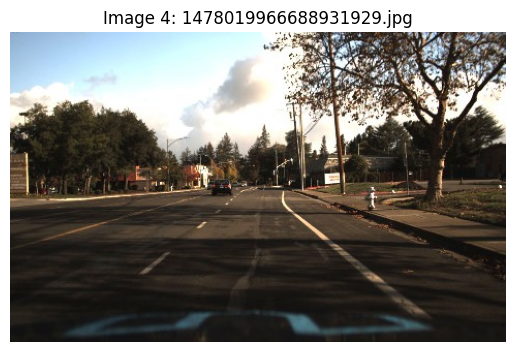

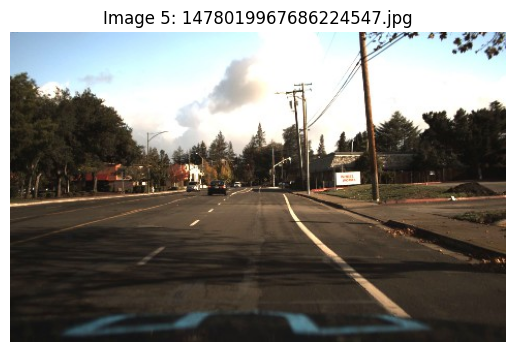

...

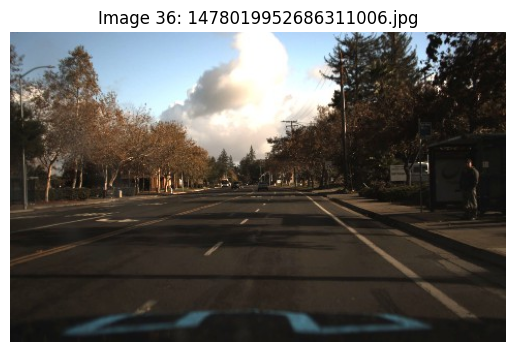

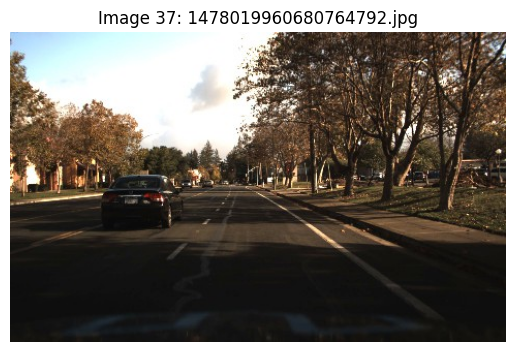

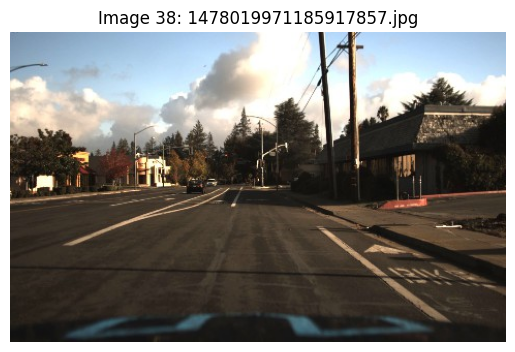

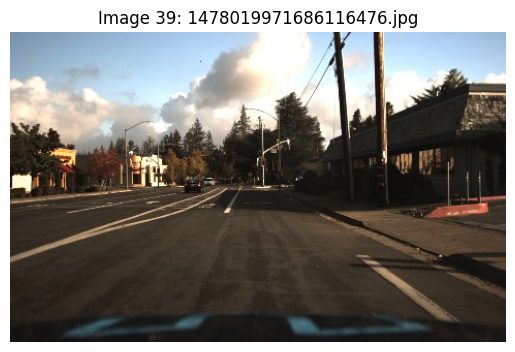

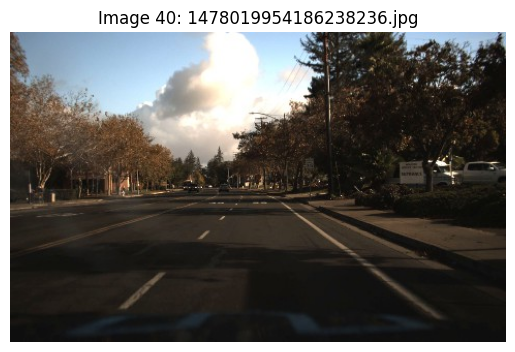

In [ ]:
import os
from PIL import Image

# Specify the directory containing the images
new_images_dir = '/content/drive/MyDrive/new data/image'

# Get the list of image filenames
new_image_filenames = os.listdir(new_images_dir)

# Plot the images
for i, image_filename in enumerate(new_image_filenames):
    # Choose an image to plot
    image_path = os.path.join(new_images_dir, image_filename)

    # Open and plot the image
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.title(f"Image {i+1}: {image_filename}")
    plt.show()


In [ ]:
import os
import cv2
import numpy as np
import torchvision
import torchvision.transforms as transforms
from google.colab.patches import cv2_imshow

print("Faster R-CNN object detection")

# COCO dataset class names
classes = [
    'background','person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack',
    'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee',
    'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
    'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk',
    'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush'
]

# Directory containing images
image_dir = '/content/drive/MyDrive/new data/image'

# load the pytorch model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# set the model in evaluation mode
model.eval()

# transform to apply to input images
transform = transforms.Compose([transforms.ToPILImage(), transforms.ToTensor()])

# Iterate over each image file in the directory
for filename in os.listdir(image_dir):
    # Check if file is an image
    if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
        # Read the image file
        img = cv2.imread(os.path.join(image_dir, filename))

        # Transform the input to tensor
        nn_input = transform(img)
        output = model([nn_input])

        # Random color for each class
        colors = np.random.uniform(0, 255, size=(len(classes), 3))

        # Iterate over the network output for all boxes
        for box, box_class, score in zip(output[0]['boxes'].detach().numpy(),
                                          output[0]['labels'].detach().numpy(),
                                          output[0]['scores'].detach().numpy()):

            # Filter the boxes by score
            if score > 0.5:
                # Transform bounding box format
                box = [(int(box[0]), int(box[1])), (int(box[2]), int(box[3]))]

                # Select class color
                color = colors[box_class]

                # Extract class name
                class_name = classes[box_class]

                # Draw the bounding box
                cv2.rectangle(img=img,
                              pt1=box[0],
                              pt2=box[1],
                              color=color,
                              thickness=2)

                # Display the box class label
                cv2.putText(img=img,
                            text=class_name,
                            org=box[0],
                            fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                            fontScale=1,
                            color=color,
                            thickness=2)

        # Display the object detection result for the current image
        cv2_imshow(img)


In [ ]:
#creating user friendly interface using flask
import os
from flask import Flask, request, render_template, send_from_directory
import cv2
import numpy as np
import torchvision
import torchvision.transforms as transforms

app = Flask(__name__)

# COCO dataset class names
classes = [
    'background', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack',
    'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee',
    'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
    'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk',
    'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush'
]

# load the pytorch model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# set the model in evaluation mode
model.eval()

# transform to apply to input images
transform = transforms.Compose([transforms.ToPILImage(), transforms.ToTensor()])

@app.route('/')
def upload_form():
    return render_template('upload.html')

@app.route('/upload', methods=['POST'])
def upload_image():
    uploaded_file = request.files['file']
    if uploaded_file.filename != '':
        image_path = os.path.join('uploads', uploaded_file.filename)
        uploaded_file.save(image_path)
        annotated_image = detect_objects(image_path)
        return render_template('result.html', image_file=image_path, annotated_image=annotated_image)
    return render_template('upload.html', message='No file selected')

def detect_objects(image_path):
    # Read the image file
    img = cv2.imread(image_path)

    # Transform the input to tensor
    nn_input = transform(img)
    output = model([nn_input])

    # Random color for each class
    colors = np.random.uniform(0, 255, size=(len(classes), 3))

    # Iterate over the network output for all boxes
    for box, box_class, score in zip(output[0]['boxes'].detach().numpy(),
                                      output[0]['labels'].detach().numpy(),
                                      output[0]['scores'].detach().numpy()):
        # Filter the boxes by score
        if score > 0.5:
            # Transform bounding box format
            box = [(int(box[0]), int(box[1])), (int(box[2]), int(box[3]))]

            # Select class color
            color = colors[box_class]

            # Extract class name
            class_name = classes[box_class]

            # Draw the bounding box
            cv2.rectangle(img=img,
                          pt1=box[0],
                          pt2=box[1],
                          color=color,
                          thickness=2)

            # Display the box class label
            cv2.putText(img=img,
                        text=class_name,
                        org=box[0],
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                        fontScale=1,
                        color=color,
                        thickness=2)

    annotated_image_path = os.path.join('annotated_images', 'annotated_' + os.path.basename(image_path))
    cv2.imwrite(annotated_image_path, img)
    return annotated_image_path

@app.route('/uploads/<filename>')
def send_file(filename):
    return send_from_directory('uploads', filename)

@app.route('/annotated_images/<filename>')
def send_annotated_file(filename):
    return send_from_directory('annotated_images', filename)

if __name__ == "__main__":
    if not os.path.exists('uploads'):
        os.makedirs('uploads')
    if not os.path.exists('annotated_images'):
        os.makedirs('annotated_images')
    app.run(debug=True)
